In [1]:
import numpy as np
from torch.utils.data import DataLoader
import torch
from matplotlib import pyplot as plt

### Load dataset

In [2]:
from utils.data_utils import load_config
from utils.w4c_dataloader import RainData

config = load_config("models/configurations/config.yaml")
dataset = RainData("validation", **config["dataset"])
len(dataset)

|YEARS] ['2019', '2020']


840

### Load model

In [3]:
from models.models import WeatherFusionNet

model = WeatherFusionNet.load_from_checkpoint("weights/weather-fusion-net.ckpt", config)

### Predict

In [4]:
loader_iter = iter(DataLoader(dataset, batch_size=16))

In [5]:
sat, rad, metadata = next(loader_iter)
sat_vis = sat[:, 8]
sat_ir = sat[:, 6]
sat_wv = sat[:, 10]

treshold = 0
with torch.no_grad():
    sat2rad_out, phydnet_out, unet_out, pred_logits = model(sat, return_inter=True)
    pred = pred_logits > treshold

In [6]:
sat2rad_out.shape, phydnet_out.shape, unet_out.shape, pred_logits.shape

(torch.Size([16, 4, 252, 252]),
 torch.Size([16, 110, 252, 252]),
 torch.Size([16, 1, 32, 252, 252]),
 torch.Size([16, 1, 32, 252, 252]))

### Intermediate steps

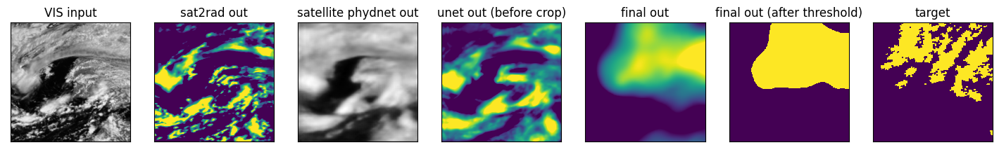

In [25]:
sample_index = -2
pred_t = 5
fig, axs = plt.subplots(1, 7, figsize=(18, 3))
axs[0].imshow(sat_vis[sample_index, -1], cmap="gray")
axs[0].set_title("VIS008 input")

axs[1].imshow(sat2rad_out[sample_index, -1], vmin=-2, vmax=2)
axs[1].set_title("sat2rad out")

axs[2].imshow(phydnet_out[sample_index, pred_t * 11 + 8], cmap="gray")
axs[2].set_title("satellite phydnet out")

axs[3].imshow(unet_out[sample_index, 0, pred_t], vmin=-2, vmax=2)
axs[3].set_title("unet out (before crop)")

axs[4].imshow(pred_logits[sample_index, 0, pred_t], vmin=-2, vmax=2)
axs[4].set_title("final out")

axs[5].imshow(pred[sample_index, 0, pred_t], vmin=0, vmax=1, interpolation="none")
axs[5].set_title("final out (after threshold)")

axs[6].imshow(rad[sample_index, 0, pred_t], interpolation="none")
axs[6].set_title("target")

for ax in axs.ravel(): ax.set_xticks([])
for ax in axs.ravel(): ax.set_yticks([])
plt.show()

### PhyDNet output

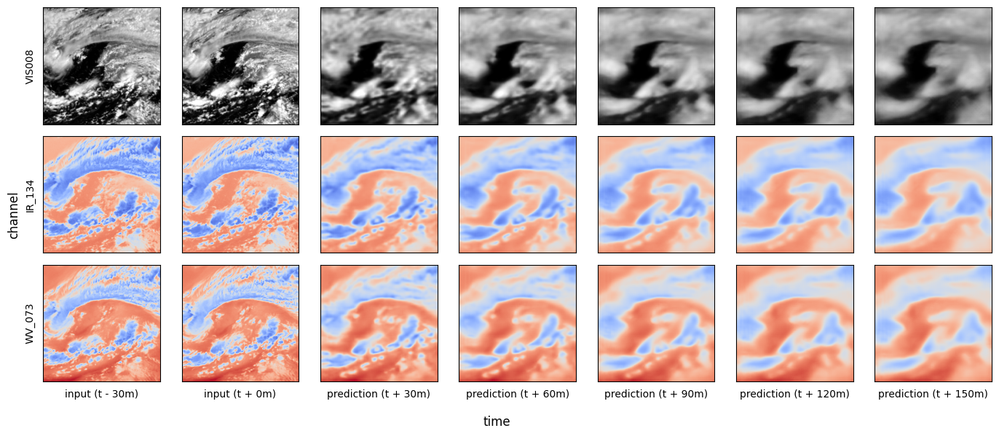

In [49]:
sample_index = -2
start = 1
stride = 2
fig, axs = plt.subplots(3, 14 // stride, figsize=(14, 6))

for t in range(start, 4, stride):
    axs[0, t//stride].imshow(sat_vis[sample_index, t], cmap="gray", vmin=0.8*sat_vis.min(), vmax=0.8*sat_vis.max())
    axs[1, t//stride].imshow(sat_ir[sample_index, t], cmap="coolwarm", vmin=0.8*sat_ir.min(), vmax=0.8*sat_ir.max())
    axs[2, t//stride].imshow(sat_wv[sample_index, t], cmap="coolwarm", vmin=0.8*sat_wv.min(), vmax=0.8*sat_wv.max())

for t in range(start, 10, stride):
    axs[0, (t + 4)//stride].imshow(phydnet_out[sample_index, t * 11 + 8], cmap="gray", vmin=0.8*sat_vis.min(), vmax=0.8*sat_vis.max())
    axs[1, (t + 4)//stride].imshow(phydnet_out[sample_index, t * 11 + 6], cmap="coolwarm", vmin=0.8*sat_ir.min(), vmax=0.8*sat_ir.max())
    axs[2, (t + 4)//stride].imshow(phydnet_out[sample_index, t * 11 + 10], cmap="coolwarm", vmin=0.8*sat_wv.min(), vmax=0.8*sat_wv.max())

for ax in axs.ravel(): ax.set_xticks([])
for ax in axs.ravel(): ax.set_yticks([])

plt.setp(axs[0, 0], ylabel='VIS008')
plt.setp(axs[1, 0], ylabel='IR_134')
plt.setp(axs[2, 0], ylabel='WV_073')

for t in range(start, 14, stride):
    plt.setp(axs[-1, t//stride], xlabel=f"{'input' if t < 4 else 'prediction'} (t {'-' if t < 3 else '+'} {abs(t-3)*15}m)")

fig.supxlabel("time")
fig.supylabel("channel")

plt.tight_layout()
plt.show()

### Plot last input frame and first output frame

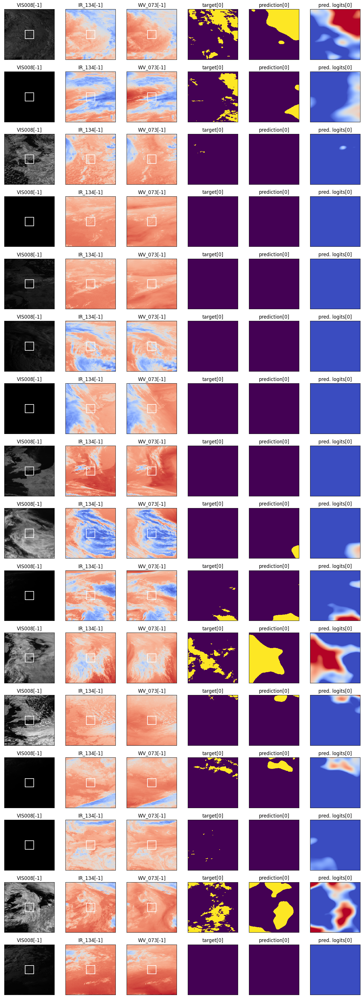

In [65]:
fig, axs = plt.subplots(len(pred), 6, figsize=(13, 35))
rect_x, rect_y = [105, 147, 147, 105, 105], [105, 105, 147, 147, 105]

for i in range(len(pred)):
    axs[i, 0].imshow(sat_vis[i, -1], vmin=sat_vis.min(), vmax=sat_vis.max(), cmap="gray", interpolation="none")
    axs[i, 0].plot(rect_x, rect_y, color="white")
    axs[i, 0].set_title("VIS008[-1]")

    axs[i, 1].imshow(sat_ir[i, -1], vmin=sat_ir.min(), vmax=sat_ir.max(), cmap="coolwarm", interpolation="none")
    axs[i, 1].plot(rect_x, rect_y, color="white")
    axs[i, 1].set_title("IR_134[-1]")

    axs[i, 2].imshow(sat_wv[i, -1], vmin=sat_wv.min(), vmax=sat_wv.max(), cmap="coolwarm", interpolation="none")
    axs[i, 2].plot(rect_x, rect_y, color="white")
    axs[i, 2].set_title("WV_073[-1]")

    axs[i, 3].imshow(rad[i, 0, 0], interpolation="none", vmin=0, vmax=1)
    axs[i, 3].set_title("target[0]")

    axs[i, 4].imshow(pred[i, 0, 0], interpolation="none", vmin=0, vmax=1)
    axs[i, 4].set_title("prediction[0]")

    axs[i, 5].imshow(pred_logits[i, 0, 0], interpolation="none", cmap="coolwarm", vmin=-2, vmax=2)
    axs[i, 5].set_title("pred. logits[0]")

for ax in axs.ravel(): ax.set_xticks([])
for ax in axs.ravel(): ax.set_yticks([])
fig.tight_layout()
plt.show()

### Animate output

In [80]:
from utils.visualization import artist_animation, animate

fig, axs = plt.subplots(1, 3, figsize=(6, 2))
fig.tight_layout()

def frame(i, t):
    yield axs[0].imshow(rad[i, 0, t], interpolation="none")
    yield axs[0].set_title("target")

    yield axs[1].imshow(pred[i, 0, t], interpolation="none", vmin=0, vmax=1)
    yield axs[1].set_title("prediction")

    yield axs[2].imshow(pred_logits[i, 0, t], interpolation="none", cmap="coolwarm", vmin=-2, vmax=2)
    yield axs[2].set_title("pred. logits")

for ax in axs.ravel(): ax.set_xticks([])
for ax in axs.ravel(): ax.set_yticks([])

for i in range(0, 16):
    artist_animation(fig, [list(frame(i, t)) for t in range(32)])

### Ouput sequence

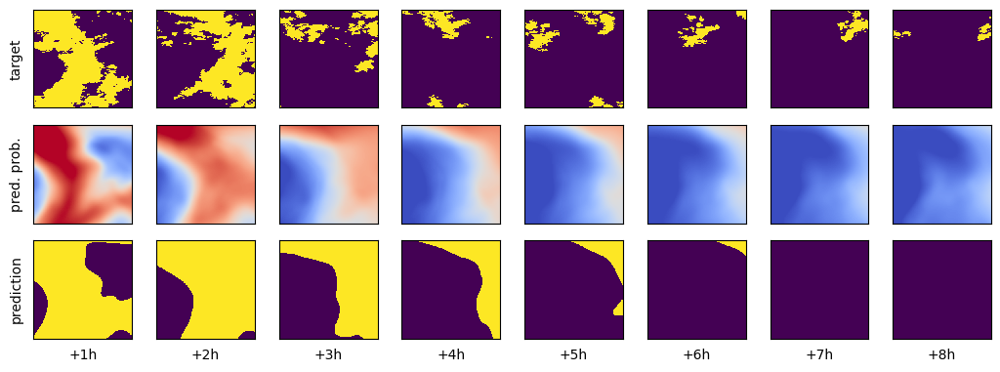

In [100]:
sample_index = 4
stride = 4
start = 3
fig, axs = plt.subplots(3, 32//stride, figsize=(8*1.3, 3*1.3))

for t in range(start, 32, stride):
    axs[0, t//stride].imshow( rad[sample_index, 0, t], vmin=0, vmax=1, interpolation="none")
    axs[1, t//stride].imshow(torch.sigmoid(pred_logits[sample_index, 0, t]), vmin=0.1, vmax=0.9, interpolation="none", cmap="coolwarm")
    axs[2, t//stride].imshow(pred[sample_index, 0, t], vmin=0, vmax=1, interpolation="none")

for ax in axs.ravel(): ax.set_xticks([])
for ax in axs.ravel(): ax.set_yticks([])
plt.setp(axs[0, 0], ylabel='target')
plt.setp(axs[1, 0], ylabel='pred. prob.')
plt.setp(axs[2, 0], ylabel='prediction')

for t in range(start, 32, stride):
    plt.setp(axs[-1, t//stride], xlabel=f"+{(t+1)//4}h")

plt.tight_layout()
plt.show()